# Image Generator Cifar10

<center>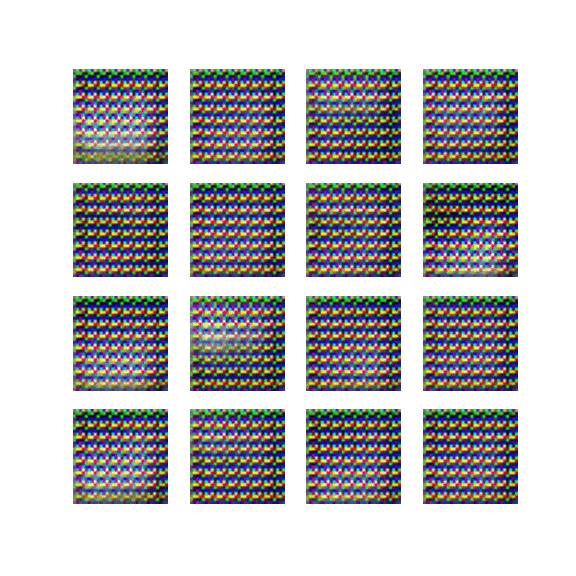</center>

DCGAN(Deep Convolutional Generative Adversarial Network) 모델을 설계하여 Cifar10 데이터를 생성한다.

![image](https://miro.medium.com/max/603/1*IM4owfqWXpwxF9btFbggpw.png)

### **Generator**

- 입력: random noise
- 출력: image

**Structure**<br/>

- G: (100, 100) // noise vector with batch size 100
- G: (100, 16384) // after linear
- G: (100, 8, 8, 256) // reshape
- G: (100, 8, 8, 128) // after deconv2d 5x5 stride 1
- G: (100, 16, 16, 64) // after deconv2d 5x5 stride 2
- G: (100, 32, 32, 3) // after deconv2d 5x5 stride 2 and tanh out

<br/>

### **Discriminator**

- 입력: image
- 출력: 1 dim vector

**Structure**<br/>

- D: (100, 32, 32, 3) // input image shape with batch size 100
- D: (100, 16, 16, 64) // after conv2d 5x5 stride 2
- D: (100, 8, 8, 128) // after conv2d 5x5 stride 2
- D: (100, 8192) // flatten
- D: (100, 1) // sigmoid out

In [1]:
import tensorflow as tf
from tensorflow.keras import layers

import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import time
import PIL
import imageio
from IPython import display

In [2]:
(train_x, _), (_, _) = tf.keras.datasets.cifar10.load_data()
train_x.shape

(50000, 32, 32, 3)

In [3]:
print("before: [{} - {}]".format(train_x.min(), train_x.max()))
train_x = ((train_x - 127.5) / 127.5)
print("after:  [{} - {}]".format(train_x.min(), train_x.max()))

before: [0 - 255]
after:  [-1.0 - 1.0]


In [4]:
# 기본적으로 float64로 되어있는데 generator를 통해 생성한 이미지는 float32로 나오기 때문에 변환을 해주지 않으면 각각 비교가 어렵다.
print("before: ", train_x.dtype)
train_x = train_x.astype("float32")
print("after : ", train_x.dtype)

before:  float64
after :  float32


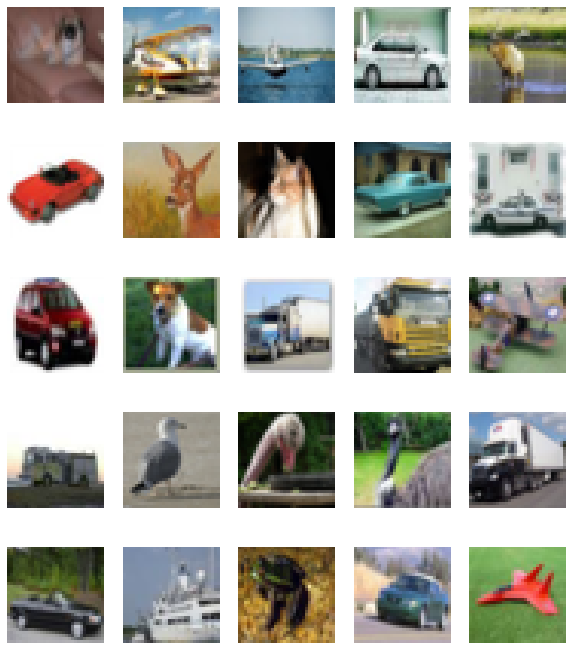

In [5]:
# train data를 확인한다.
plt.figure(figsize=(10, 12))

for i in range(25):
    random_idx = np.random.randint(train_x.shape[0])
    plt.subplot(5,5,i+1)
    plt.axis("off")
    plt.imshow((train_x[random_idx] * 127.5 + 127.5).astype("int32"))

plt.show()

In [6]:
BUFFER_SIZE = train_x.shape[0]
BATCH_SIZE = 256

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [7]:
def make_generator_model():
    model = tf.keras.Sequential(
        [
            layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(100, )),
            layers.BatchNormalization(),
            layers.LeakyReLU(),

            layers.Reshape((8, 8, 256)),

            layers.Conv2DTranspose(128, 5, strides=1, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.LeakyReLU(),

            layers.Conv2DTranspose(64, 5, strides=2, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.LeakyReLU(),

            layers.Conv2DTranspose(3, 5, strides=2, padding='same', use_bias=False, activation='tanh'),
        ]
    )

    return model

In [8]:
def make_discriminator_model():
    model = tf.keras.Sequential(
        [
            layers.Conv2D(64, 5, strides=2, padding='same', input_shape=(32, 32, 3)),
            layers.LeakyReLU(),
            layers.Dropout(0.3),

            layers.Conv2D(128, 5, strides=2, padding='same'),
            layers.LeakyReLU(),
            layers.Dropout(0.3),

            layers.Flatten(),

            layers.Dense(1)
        ]
    )

    return model

Text(0.5, 1.0, 'decision: [[-0.00284803]]')

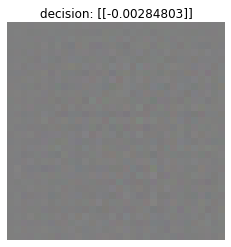

In [9]:
# 생성한 모델이 잘 동작하는지 확인한다.
generator = make_generator_model()
discriminator = make_discriminator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise)
decision = discriminator(generated_image)

plt.imshow((generated_image[0].numpy() * 127.5 + 127.5).astype("int32"))
plt.axis("off")
plt.title(f"decision: {decision}")

In [10]:
# Generator는 생성한 이미지가 진짜로 판별되기를 원한다.
# Discriminator은 진짜 이미지가 진짜로, 가짜 이미지가 가짜로 판별하기를 원한다.

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [11]:
# 판별자의 정확도는 진짜 이미지를 진짜로 판별했는지, 가짜를 가짜로 판별했는지 확인한다.
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

In [12]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [13]:
# 학습 과정을 손쉽게 확인하기 위해서 seed는 한번 생성한 뒤 계속 사용한다. 
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

In [14]:
# 배치 단위로 학습을 하는 부분이다. 
# generator, discriminator를 번갈아가며 학습한다. 
# 각각 모델의 Loss를 계산하고 이를 통해 역전파를 거쳐 미분값을 구하고 optimizer를 거쳐 파라미터를 업데이트한다.
@tf.function
def train_step(images): 
    noise = tf.random.normal([BATCH_SIZE, noise_dim]) 

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True) 

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy 

In [15]:
def generate_and_save_images(model, epoch, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        # 입력할 때 [-1, 1]로 이미지를 정규화 하였고 출력도 tanh를 거쳐 [-1, 1]이 되도록 설계하였다.
        # 이를 다시 복구해주기 위해 x * 127.5 + 127.5 계산한다.
        plt.imshow((predictions[i].numpy() * 127.5 + 127.5).astype("int32"))
        plt.axis('off')
   
    plt.savefig('./generated_samples/sample_epoch_{:04d}.png'
                    .format(epoch))
    fig.suptitle("Epoch : {}".format(epoch))
    plt.show()

In [16]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6

def draw_train_history(history, epoch):
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    plt.savefig('./training_history/train_history_{:04d}.png'
                    .format(epoch))
    plt.show()

In [17]:
# 학습의 진행상황을 확인할 수 있는 함수이다. 
# 학습의 log들을 모아 history에 저장하여 시각화한다.
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)


        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch, seed)
        print('[ {} | {} ] - Time for training : {} sec'.format(epoch+1, epochs, int(time.time()-start)))

        draw_train_history(history, epoch)

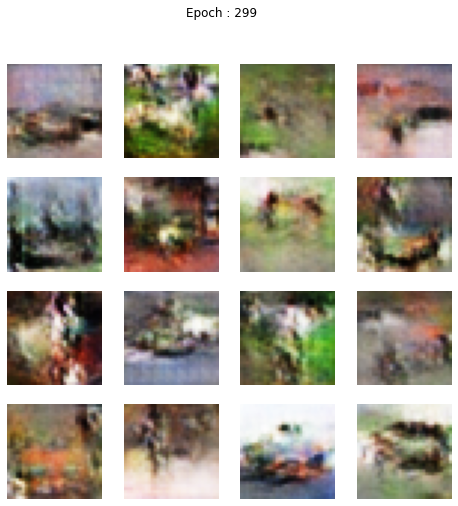

[ 300 | 300 ] - Time for training : 4379 sec


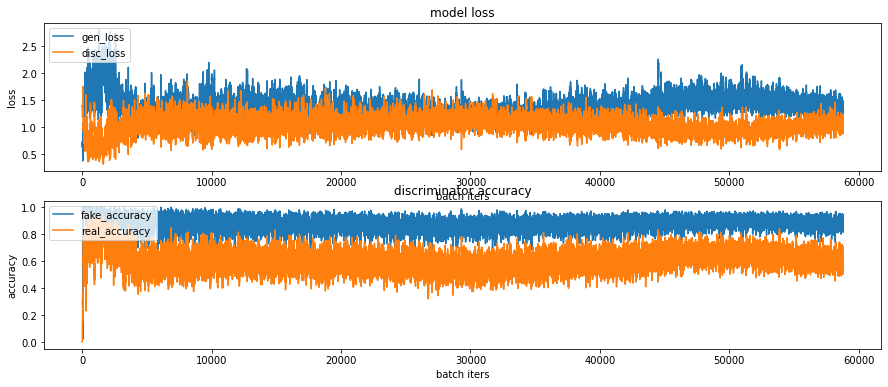

CPU times: user 1h 14min 58s, sys: 44.7 s, total: 1h 15min 42s
Wall time: 1h 13min 1s


In [18]:
%%time

save_every = 10
EPOCHS = 300

train(train_dataset, EPOCHS, save_every)

In [28]:
# generated_samples 폴더에 저장된 파일들을 읽어서 gif 파일로 만들어준다.

def make_gif(name):
    with imageio.get_writer(name + '.gif', mode='I') as writer:
        filenames = glob.glob('./generated_samples/sample*.png')
        filenames = sorted(filenames)
        last = -1
        
        for i, filename in enumerate(filenames):
            frame = 2*(i**0.5)
            if round(frame) > round(last):
                last = frame
            else:
                continue
            image = imageio.imread(filename)
            writer.append_data(image)
        image = imageio.imread(filename)
        writer.append_data(image)


In [29]:
make_gif('cifar10_dcgan')

| Epoch 300 Image | GIF |
| --- | --- |
| 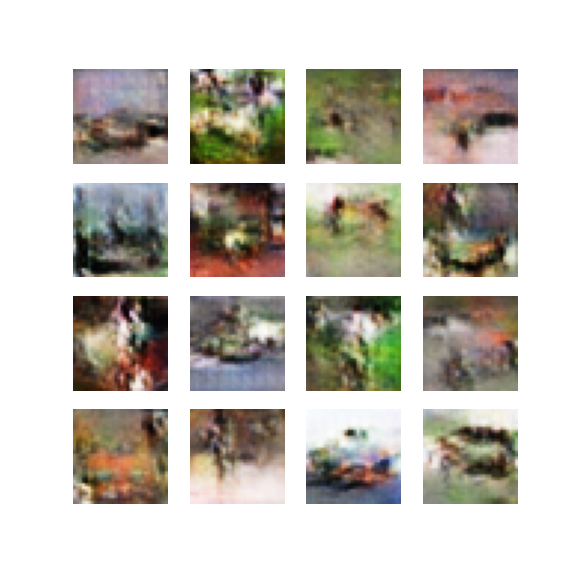 |  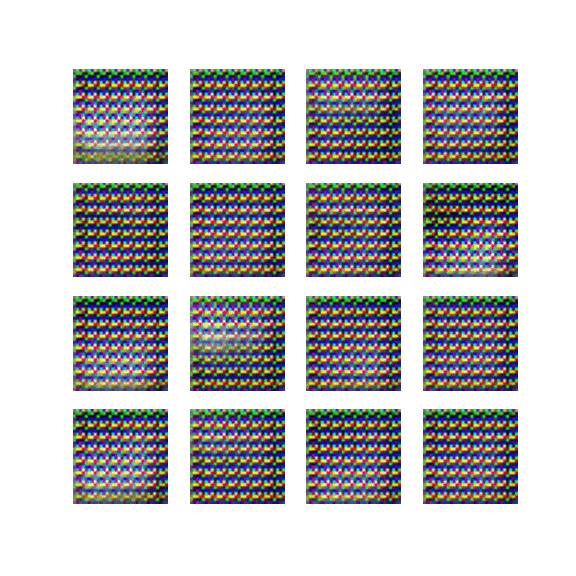|

## 모델 재설계하기

모델학습에 있어서 Generator와 Discriminator의 난이도가 같을까? 물론 아니다.<br/>
Generator에 비해 Discriminator는 조금 더 쉬운 문제플 풀고있다. 게다가 batch 단위로 가짜 이미지도 보고 진짜 이미지도 Discriminator는 보고 학습한다. 하지만 Generator는 batch 단위의 가짜이미지만 보고있다. 이를 학습과정에서 조금 수정하려한다.

또한 모델도 [여기](https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/)를 보고 조금 더 깊게 쌓았다.

### **Generator**

**Structure**<br/>

- G: (100, 100) // noise vector with batch size 100
- G: (100, 4096) // after linear
- G: (100, 4, 4, 256) // reshape
- G: (100, 8, 8, 128) // after deconv2d 5x5 stride 1
- G: (100, 16, 16, 128) // after deconv2d 5x5 stride 2
- G: (100, 32, 32, 128) // after deconv2d 5x5 stride 2
- G: (100, 32, 32, 3) // after conv2d 3x3 stride 1 and tanh out

<br/>

### **Discriminator**

**Structure**<br/>

- D: (100, 32, 32, 3) // input image shape with batch size 100
- D: (100, 32, 32, 64) // after conv2d 5x5 stride 2
- D: (100, 16, 16, 128) // after conv2d 5x5 stride 2
- D: (100, 8, 8, 128) // after conv2d 5x5 stride 2
- D: (100, 4, 4, 128) // after conv2d 5x5 stride 2
- D: (100, 2048) // flatten
- D: (100, 1) // sigmoid out

In [30]:
def build_generator_model(noise_dim):
    model = tf.keras.Sequential(
        [
            layers.Dense(4*4*256, input_shape=(noise_dim, )),
            layers.LeakyReLU(alpha=0.2),
            layers.Reshape((4, 4, 256)),

            layers.Conv2DTranspose(128, 4, strides=2, padding='same'),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2DTranspose(128, 4, strides=2, padding='same'),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2DTranspose(128, 4, strides=2, padding='same'),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2D(3, 3, activation='tanh', padding='same')
        ]
    )
    return model

In [34]:
def build_discriminator_model():
    model = tf.keras.Sequential(
        [
            layers.Conv2D(64, 3, padding='same', input_shape=(32, 32, 3)),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2D(128, 3, strides=2, padding='same'),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2D(128, 3, strides=2, padding='same'),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2D(256, 3, strides=2, padding='same'),
            layers.LeakyReLU(alpha=0.2),

            layers.Flatten(),
            layers.Dropout(0.4),
            layers.Dense(1, activation='sigmoid')
        ]
    )
    return model

In [35]:
generator = build_generator_model(noise_dim)
discriminator = build_discriminator_model()

In [36]:
loss_fn = tf.keras.losses.BinaryCrossentropy()

generator_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

In [37]:
# 위에선 train step 함수를 따로 만들었지만 이번에는 train 함수에 학습과정도 포함하였다.
# 주석의 내용 외엔 위와 동일하다.
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}
    half_batch = int(BATCH_SIZE / 2)
    for epoch in range(epochs):
        for it, real_images in enumerate(dataset):

            # 진짜 이미지(batch의 절반)로 discriminator 학습
            with tf.GradientTape() as tape:
                real_output = discriminator(real_images[:half_batch], training=True)
                d_loss_real = loss_fn(tf.ones_like(real_output), real_output) # Discriminator에 real images를 넣은 뒤 Loss를 구한다.
                real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
            gradients_of_discriminator = tape.gradient(d_loss_real, discriminator.trainable_variables)
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
            
            # 가짜 이미지(batch의 절반)로 discriminator 학습
            with tf.GradientTape() as tape:
                noise = tf.random.normal([half_batch, noise_dim])
                fake_images = generator(noise)
                fake_output = discriminator(fake_images, training=True)
                d_loss_fake = loss_fn(tf.zeros_like(fake_output), fake_output) # Discriminator에 real images를 넣은 뒤 Loss를 구한다.
                fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
            gradients_of_discriminator = tape.gradient(d_loss_fake, discriminator.trainable_variables)
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

            # 가짜 이미로 generator 학습
            with tf.GradientTape() as tape:
                noise = tf.random.normal([BATCH_SIZE, noise_dim])
                fake_images = generator(noise, training=True)
                fake_output = discriminator(fake_images, training=False)
                gen_loss = loss_fn(tf.ones_like(fake_output), fake_output)
            gradients_of_generator = tape.gradient(gen_loss, generator.trainable_variables)
            generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))

            disc_loss = d_loss_real + d_loss_fake

            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)


        if (epoch + 1) % save_every == 0:
            filename = "models/generator_model_{:04d}.h5".format(epoch + 1)
            generator.save(filename)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, seed)
        draw_train_history(history, epoch)
        print('[ {} | {} ] - Time for training : {} sec'.format(epoch+1, epochs, int(time.time()-start)))
        
    return history

In [ ]:
%%time

save_every = 10
EPOCHS = 100

history = train(train_dataset, EPOCHS, save_every)

| Epoch 100 Image | GIF |
| --- | --- |
| 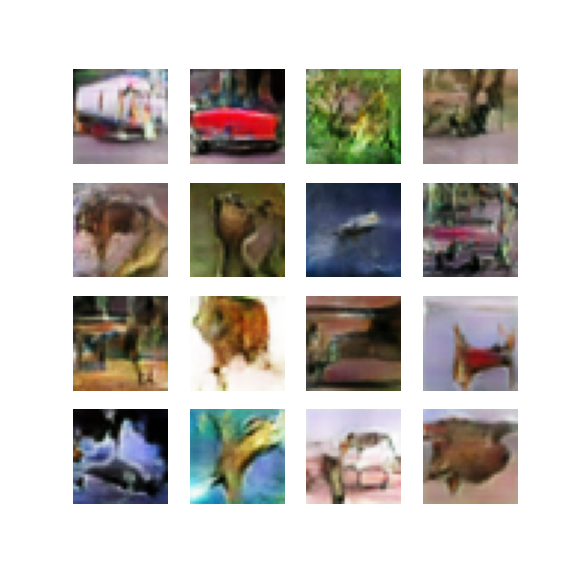 | 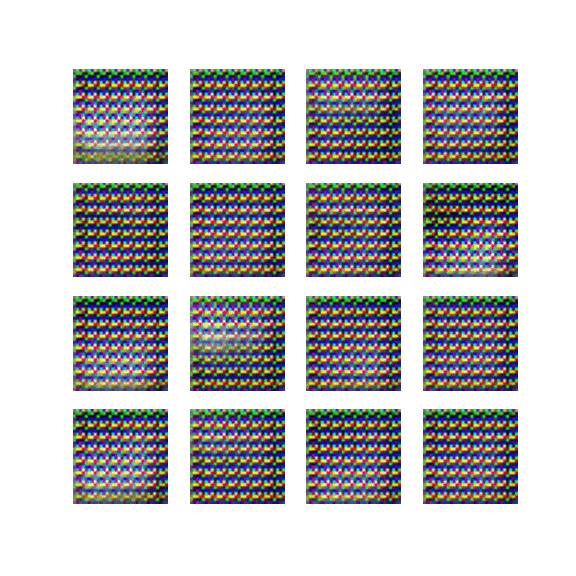 |

### 결론

항상 데이터가 더 중요하다고 생각했었다. 물론 아니였다. cifar10과 같이 데이터가 잘 정제되어 있을 경우 모델의 중요도가 더욱 커진것을 볼 수 있었다. 이번 과제를 하면서 GAN 모델에서 Loss와 Acc의 의미에 대해 이해하고, generator, discriminator의 학습 난이도에 대해 같은 조 인원들과 생각하는 과정을 거쳤는데 이를 통해 GAN에 대해 더 깊게 이해할 수 있었다. 다만, 아쉬운점은 activation function에서 `alpha`의 의미와 optimizer에서 `beta`로 쓰이는 Momentom을 조절하고 어떻게 학습에 영향을 끼쳤는지 요인들을 확인하지 못했다.